## Dog breed Classification project

### Getting our workspace ready

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
Unzip the uploaded data into google drive
!unzip "/content/drive/MyDrive/Dog_Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog_Vision"

In [1]:
# Import tensorflow into colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF Version :" ,tf.__version__)
print("TF hub version:", hub.__version__)

# Check for the availability of GPU
print("GPU available! yess" if tf.config.list_physical_devices("GPU") else "GPU not available")

TF Version : 2.15.0
TF hub version: 0.16.1
GPU not available


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog_Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [3]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

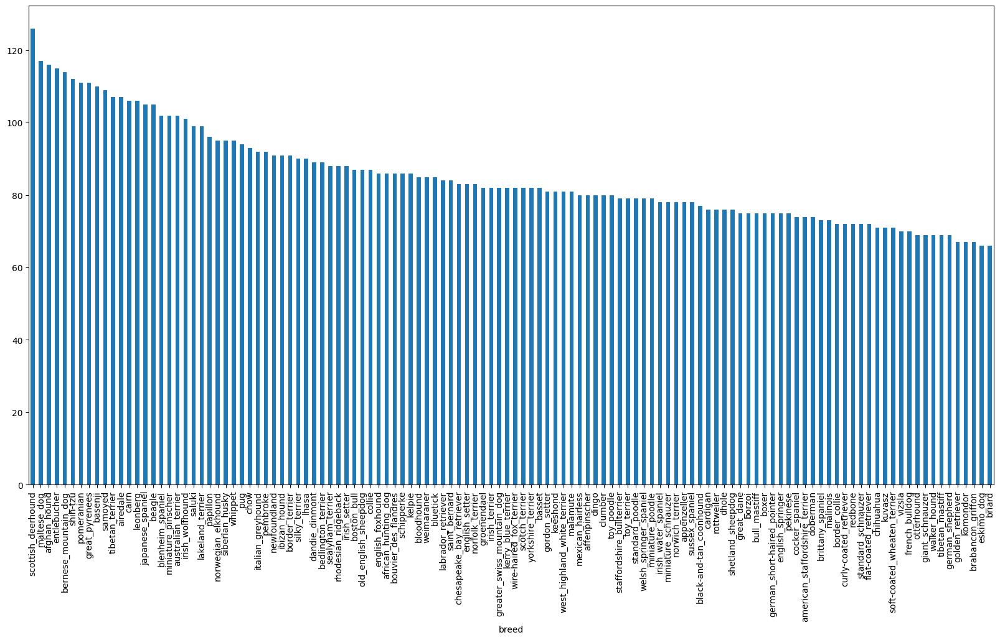

In [4]:
labels_csv["breed"].value_counts().plot.bar(figsize = (20,10))

In [5]:
labels_csv["breed"].value_counts().median()

82.0

In [6]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [7]:
filenames = ["/content/drive/MyDrive/Dog_Vision/train/"+fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['/content/drive/MyDrive/Dog_Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog_Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog_Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog_Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog_Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog_Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog_Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog_Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog_Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog_Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [8]:
import os
if len(os.listdir("/content/drive/MyDrive/Dog_Vision/train/")) == len(filenames):

  print("The length of filename is same as actual train model! You can proceed")
else:
  print("filename length does not match")

The length of filename is same as actual train model! You can proceed


In [9]:
import os
len(os.listdir("/content/drive/MyDrive/Dog_Vision/train/"))

10222

In [11]:
len(filenames)

10222

In [10]:
from IPython.display import Image, display

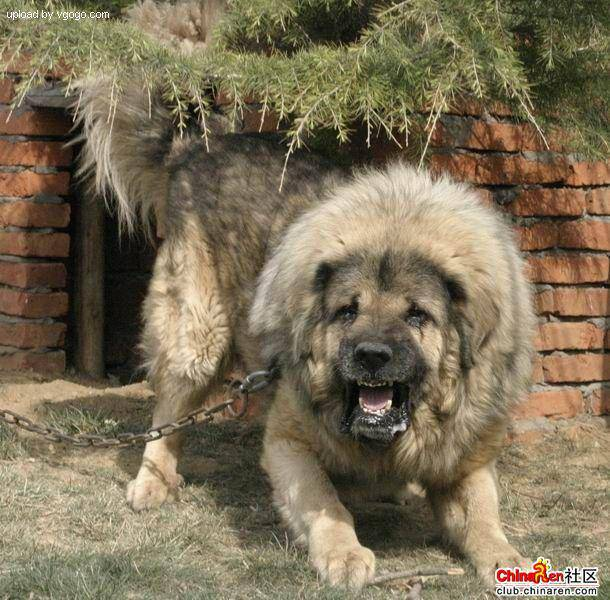

In [11]:
Image(filenames[9000])

In [12]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [13]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [14]:
len(labels)

10222

In [15]:
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [16]:
print(labels[0])
unique_breeds ==labels[0]


boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [17]:
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [18]:
len(labels)

10222

In [19]:

print(labels[0])
print(np.where(unique_breeds == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [20]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [21]:
%lsmagic

## Creating our own Validation set
Since the dataset from kaggle didn't come with a validation set we will create our own


In [22]:
# Setup X and y variables
X = filenames
y = boolean_labels

In [23]:
# Setup the number of images to be used for Experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [24]:
# Let's split our data into train and validation set
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state = 42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [25]:
X_train[:5], y_train[:2]

(['/content/drive/MyDrive/Dog_Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog_Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Dog_Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Dog_Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Dog_Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fals

## Preprocessing images(turning images into tensors)
To preprocess our image we are going to write a function which do few things:
1. Take an `image` filepath as input
2. Use tensorflow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into tensors
4. Resize the `image` to be a shape of (224,224)
5. Return the modified `image`.

Before we do we will see what importing an image look like


In [26]:
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [27]:
image.max(), image.min()

(255, 0)

In [28]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [29]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [30]:
# Define Image Size
IMG_SIZE = 224

# Create a function for preprocessing image
def process_image(image_path, img_size = IMG_SIZE):
  """
  Take an image file an convert it into tensors
  """

  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpeg into numerical tensors with chanel color = 3
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the color channel values from (0-255) to (0-1)(Normalization)
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to get our desired value of (224,224)
  image = tf.image.resize(image, size = (IMG_SIZE, IMG_SIZE))

  return image


### Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process data with 10000+ images in one go.. they might not fit into the memory

So that's why we use 32(this is the batch size) images at a time (you can adjust it if needed to be..)

In [31]:
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

In [32]:
get_image_label(X[43],tf.constant(y[43]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.6932511 , 0.6422707 , 0.50893736],
         [0.7049195 , 0.6539391 , 0.51668423],
         [0.7189601 , 0.66415447, 0.5268996 ],
         ...,
         [0.28510195, 0.23804314, 0.19098432],
         [0.23658979, 0.18953097, 0.14247213],
         [0.17295183, 0.13373615, 0.08667732]],
 
        [[0.68057597, 0.6295956 , 0.49626228],
         [0.69162816, 0.64064777, 0.50731444],
         [0.706784  , 0.6519783 , 0.51481974],
         ...,
         [0.29755813, 0.2504993 , 0.20344049],
         [0.24967629, 0.20261747, 0.15555863],
         [0.18719192, 0.14797622, 0.1009174 ]],
 
        [[0.6738776 , 0.6228972 , 0.49740702],
         [0.6841212 , 0.6331408 , 0.5004377 ],
         [0.7016797 , 0.64304876, 0.51417094],
         ...,
         [0.25748226, 0.21042345, 0.16336462],
         [0.23216338, 0.18510455, 0.13804573],
         [0.17874685, 0.13953117, 0.09247234]],
 
        ...,
 
        [[0.56411815, 0.5932849 

In [33]:
# We will use a batch size to reduce the number of data processed at a time(32 is a good start)
BATCH_SIZE = 32
# Create a function to turn data into batches
def create_data_batches(X, y= None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates data_batches out of Image(X) and label(y) pairs
  shuffle the data if its training data but doesn't shuffle if validation data
  Also accepts test_data as input
  """
  # If data is test dataset it probably doesn't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is valid dataset we don't need to shuffle it
  elif valid_data:
    print("Creating valid data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),#Filepaths
                                               tf.constant(y)))#labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  # If valid data is false and valid data is also false it'll contain the training data
  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))

  # Shuffling pathnames and labels before image processor function is faster than the shuffle
    data = data.shuffle(buffer_size=len(X))
    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [34]:
# Create training and valid data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data = True)

Creating training data batches...
Creating valid data batches...


In [35]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches

Our data is now in batches however these can be a little hard to comprehend/understand, let's visualize them

In [36]:
import matplotlib.pyplot as plt

def show_25_images(images, labels, class_names):
    """
    Display a 5x5 grid of images with their corresponding labels.
    - images: Batch of images (NumPy array or tensor)
    - labels: Corresponding labels (class indices or one-hot)
    - class_names: List of class name strings
    """
    plt.figure(figsize=(10, 10))
    for i in range(25):
        ax = plt.subplot(5, 5, i + 1)
        image = images[i]

        plt.imshow(image)
        plt.axis("off")

        # Get class name from label
        if len(labels[i].shape) > 0:  # one-hot encoded
            class_index = labels[i].argmax()
        else:  # label is already an index
            class_index = labels[i]

        plt.title(class_names[class_index])

    plt.tight_layout()
    plt.show()




In [37]:
unique_breeds[y[120].argmax()]

'irish_terrier'

In [38]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [39]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [40]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

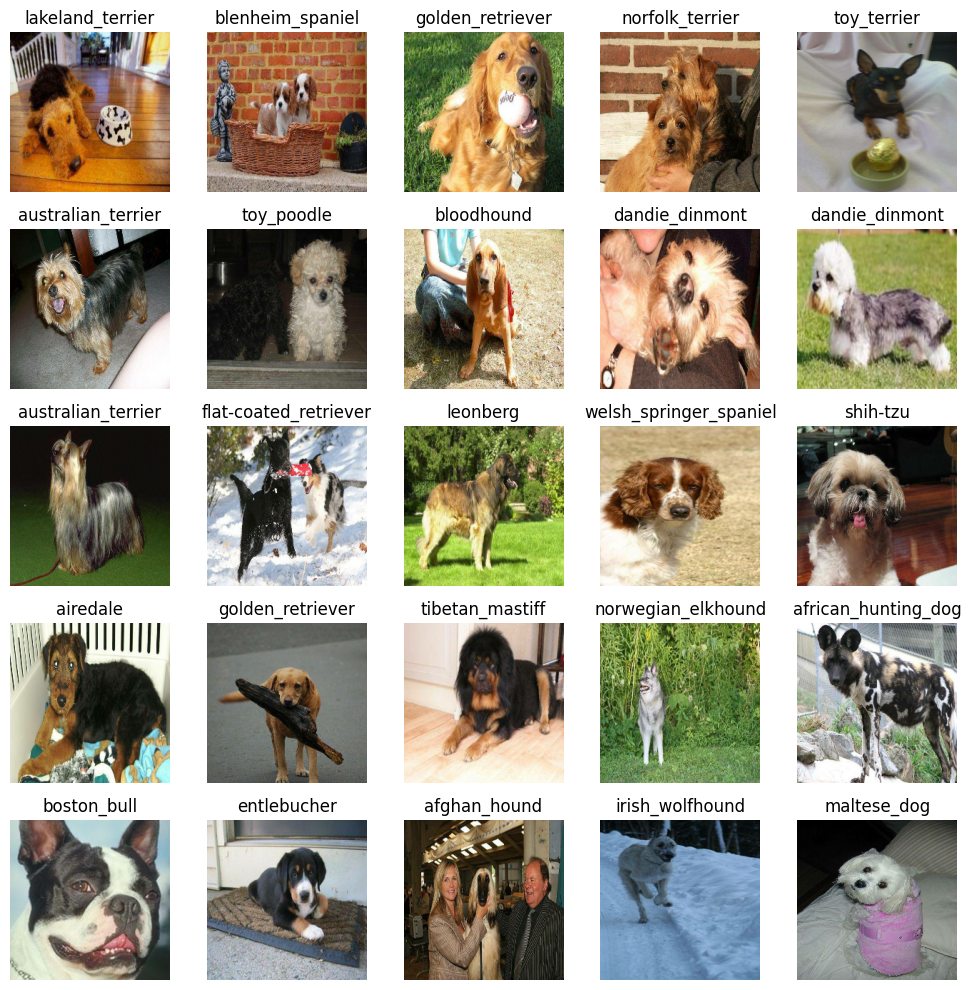

In [41]:
show_25_images(train_images, train_labels, unique_breeds)


In [42]:
print(type(train_images[0]))
print(train_images[0].shape)


<class 'numpy.ndarray'>
(224, 224, 3)


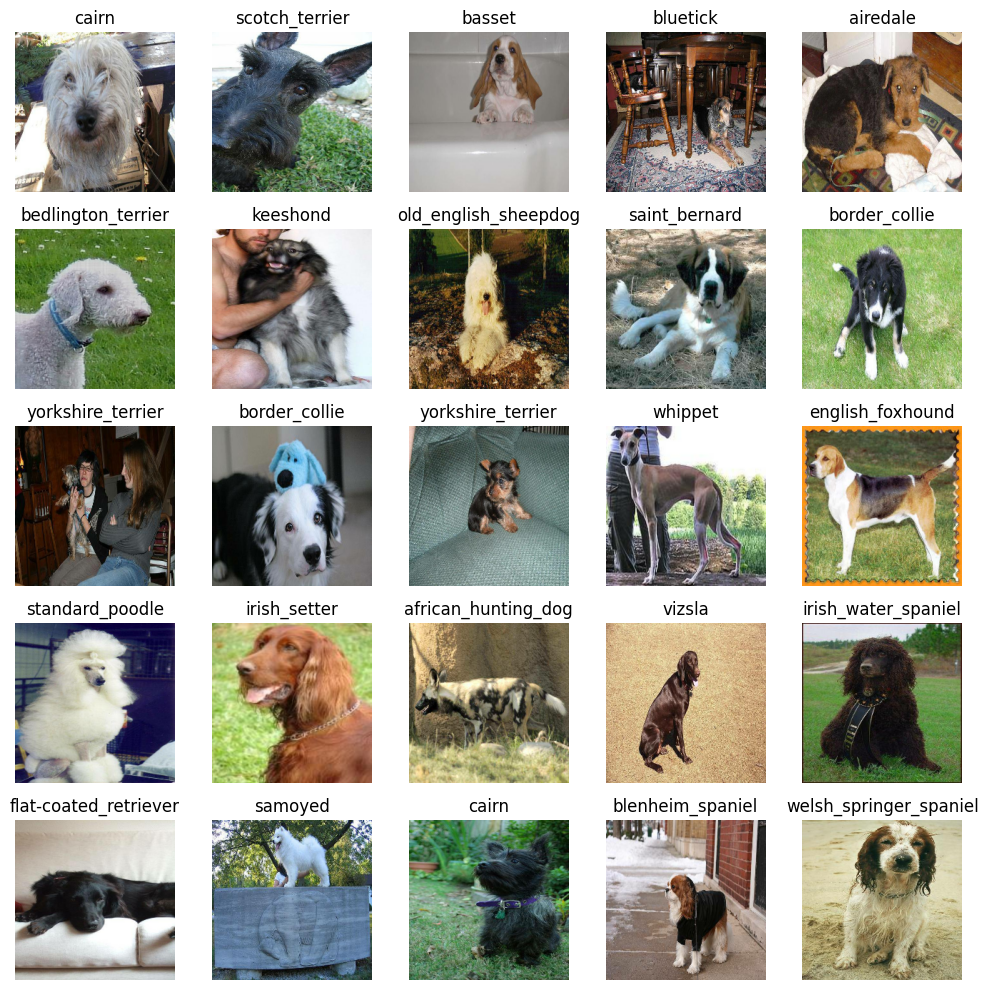

In [43]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels, unique_breeds)

## Building a model
Before we build a model, there are few things which we need to define:
* Input shape(Our image shape, in form of Tensors) to our model
* Output shape(image labels, in form of Tensors)
* The url of model we want to use


In [44]:
IMG_SIZE

224

In [45]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds) # number of unique labels

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [46]:
# !pip install tensorflow


In [47]:
# !pip install tf_keras

In [48]:

# TF_USE_LEGACY_KERAS=1

In [ ]:
# import tf_keras

In [50]:
 pip install tensorflow==2.15.0 tensorflow-hub keras==2.15.0


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.7 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of tf-keras to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.3/475.3 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 63.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 118.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 27.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 111.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 38.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 87.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.4/78.4 kB 7.6 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrap

In [49]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

  return model

In [50]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating a callback

Callbacks are helper function a model can use during training do to such things as save its progress, check its progress or even stop training when the model did'nt improve

### Tensorboard Callback

To setup a tensorboard callback we need to do three things:
1. Load the tensorboard notebook extension ✅


In [51]:
# Load tensorboard notebook extension
%load_ext tensorboard

In [52]:
import datetime
import os

# Create a function to build TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing tensorboard logs
  logdir = os.path.join("/content/drive/MyDrive/Dog_Vision/logs",# Make it so the log get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
                        )
  # Ensure the log directory exists
  os.makedirs(logdir, exist_ok=True)
  return tf.keras.callbacks.TensorBoard(logdir)

## Creating a early callback
An early callback helps in overfitting of the model

In [53]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy",
                                                  patience = 3)

## Training a model(subset of data)

In [54]:
NUM_EPOCHS = 100 #@param {type:'slider', min:10, max:100, step:10}

In [55]:
# Build a function using train a model and then return a trained model
def train_model():
  """
  Train a given model and returns a trained function
  """
  # Create a model
  model = create_model()

  # Create a new tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data creating a callback we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
# import os

# log_dir = '/content/drive/MyDrive/Dog_Vision/logs'
# os.makedirs(log_dir, exist_ok=True)


In [ ]:
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 190s 7s/step - loss: 4.4555 - accuracy: 0.1150 - val_loss: 3.3026 - val_accuracy: 0.2850
Epoch 2/100
25/25 [==============================] - 40s 2s/step - loss: 1.5603 - accuracy: 0.7163 - val_loss: 2.0778 - val_accuracy: 0.5200
Epoch 3/100
25/25 [==============================] - 39s 2s/step - loss: 0.5537 - accuracy: 0.9312 - val_loss: 1.6414 - val_accuracy: 0.6050
Epoch 4/100
25/25 [==============================] - 39s 2s/step - loss: 0.2447 - accuracy: 0.9925 - val_loss: 1.4403 - val_accuracy: 0.6500
Epoch 5/100
25/25 [==============================] - 38s 2s/step - loss: 0.1426 - accuracy: 0.9987 - val_loss: 1.3692 - val_accuracy: 0.6550
Epoch 6/100
25/25 [==============================] - 40s 2s/step - loss: 0.0990 - accuracy: 0.9987 - val_loss: 1.3369 - val_accuracy: 0.6550
Epoch 7/100
25/25 [==============================] - 41s 2s/

**Question:** It look likes our model is overfitting because it is performing far better on the training dataset than the validation some ways to prevent overfitting of the model in deep learning and neural networks?

**Note**: It is good to start our model with overfitting, it means our model is learning

In [ ]:
model.to_json()

'{"class_name": "Sequential", "config": {"name": "sequential_1", "layers": [{"module": "keras.layers", "class_name": "InputLayer", "config": {"batch_input_shape": [null, 224, 224, 3], "dtype": "float32", "sparse": false, "ragged": false, "name": "keras_layer_1_input"}, "registered_name": null}, {"module": "tensorflow_hub.keras_layer", "class_name": "KerasLayer", "config": {"name": "keras_layer_1", "trainable": false, "dtype": "float32", "handle": "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"}, "registered_name": "KerasLayer", "build_config": {"input_shape": [null, 224, 224, 3]}}, {"module": "keras.layers", "class_name": "Dense", "config": {"name": "dense_1", "trainable": true, "dtype": "float32", "units": 120, "activation": "softmax", "use_bias": true, "kernel_initializer": {"module": "keras.initializers", "class_name": "GlorotUniform", "config": {"seed": null}, "registered_name": null}, "bias_initializer": {"module": "keras.initializers", "class_name": "Zer

In [56]:
%tensorboard --logdir /content/drive/MyDrive/Dog_Vision/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using the trained model

In [57]:
predictions = model.predict(val_data, verbose = 1)
predictions

7/7 [==============================] - 143s 24s/step


array([[0.01806142, 0.00037838, 0.00122185, ..., 0.04215645, 0.01536228,
        0.00226465],
       [0.00125067, 0.00037121, 0.00337752, ..., 0.0229267 , 0.00830708,
        0.00024577],
       [0.00352811, 0.00133686, 0.00123903, ..., 0.0001387 , 0.01435112,
        0.00250823],
       ...,
       [0.00119004, 0.00230486, 0.00754125, ..., 0.00043105, 0.0180878 ,
        0.00337052],
       [0.00929714, 0.00713735, 0.00278587, ..., 0.00837876, 0.00164408,
        0.01861069],
       [0.0316709 , 0.0002082 , 0.01140841, ..., 0.01356676, 0.00550933,
        0.00286052]], dtype=float32)

In [58]:
predictions.shape

(200, 120)

In [59]:
# First predictions
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[index])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[index])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}") # the predicted label

[2.1229275e-03 1.6938792e-04 9.7201057e-03 2.3311374e-03 2.9122841e-03
 1.4908441e-03 3.1836291e-03 1.0018240e-03 2.0853658e-03 4.9236673e-03
 3.5185495e-03 4.4537243e-03 1.6844651e-03 2.4641803e-03 7.5383396e-03
 3.9419174e-04 1.7407848e-02 4.2073801e-03 6.8546913e-04 4.1862985e-04
 8.9769280e-03 2.4556876e-03 1.5924212e-03 9.3115040e-04 4.5468085e-03
 4.9130130e-03 9.2134895e-03 2.2912885e-03 1.8093548e-03 8.7509991e-04
 6.7017577e-04 1.9999683e-02 2.2263564e-03 5.4001771e-03 1.1606408e-01
 8.2859548e-04 1.3670803e-02 3.8848601e-03 3.0948536e-03 2.4648547e-02
 8.5126539e-04 2.0775704e-03 1.2894782e-03 2.2213743e-03 2.2434657e-03
 5.6231027e-03 6.8252132e-04 2.2943781e-03 2.5248777e-03 1.9489096e-02
 2.5084806e-03 2.8941559e-03 1.6312342e-03 3.5781937e-03 1.7600216e-03
 1.4455359e-03 9.0437068e-04 1.0617680e-03 3.2863540e-03 1.6070649e-03
 1.6945900e-04 6.5767616e-03 1.0359385e-03 2.2082892e-03 2.4733841e-02
 9.3857367e-03 2.1057802e-03 1.0459146e-03 1.5825575e-02 2.5865289e-03
 3.454

In [62]:
# Turn prediction probabilities into their respective label
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into labels
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Now let's test the function
pred_label = get_pred_label(predictions[0])
pred_label

'tibetan_terrier'

Wonderful! Now we've got a list of all different predictions our model has made, we'll do the same for the validation images and validation labels.

Remember, the model hasn't trained on the validation data, during the `fit()` function, it only used the validation data to evaluate itself. So we can use the validation images to visually compare our models predictions with the validation labels.

Since our validation data (`val_data`) is in batch form, to get a list of validation images and labels, we'll have to unbatch it (using [`unbatch()`](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#unbatch)) and then turn it into an iterator using [`as_numpy_iterator()`](https://www.tensorflow.org/api_docs/python/tf/data/Dataset#as_numpy_iterator).

Let's make a small function to do so.

In [63]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [64]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

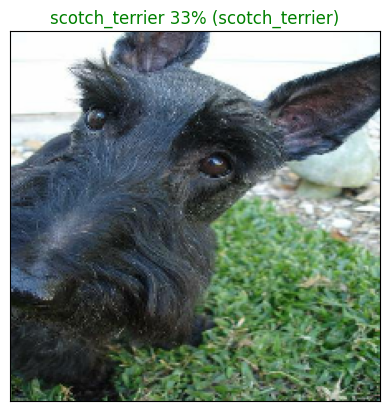

In [ ]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

In [65]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

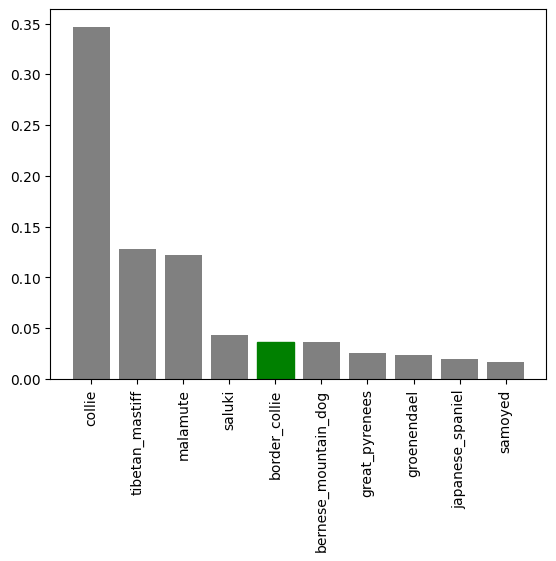

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

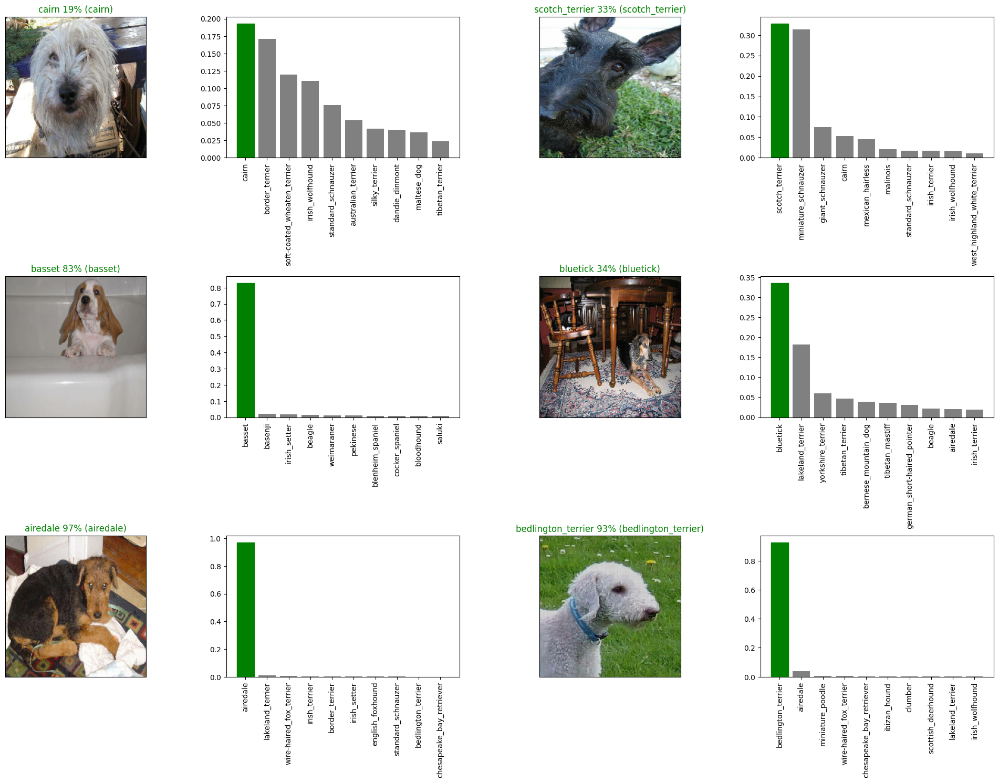

In [ ]:
# Let's check a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [66]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("/content/drive/MyDrive/Dog_Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [67]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: /content/drive/MyDrive/Dog_Vision/models/20250723-13071753276071-1000-images-Adam.h5...


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Dog_Vision/models/20250723-13071753276071-1000-images-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model('drive/My Drive/Data/models/20200131-03111580440309-all-images-Adam.h5')

In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 7s 911ms/step - loss: 1.2390 - accuracy: 0.6750


[1.238955020904541, 0.675000011920929]

## Training a model (on the full data)

Now we know our model works on a subset of the data, we can start to move forward with training one on the full data.

Above, we saved all of the training filepaths to `X` and all of the training labels to `y`. Let's check them out.

In [68]:
# Remind ourselves of the size of the full dataset
len(X), len(y)

(10222, 10222)

In [69]:
full_data = create_data_batches(X, y)

Creating training data batches...


In [70]:
# Instantiate a new model for training on the full dataset
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [71]:
# Create full model callbacks

# TensorBoard callback
full_model_tensorboard = create_tensorboard_callback()

# Early stopping callback
# Note: No validation set when training on all the data, therefore can't monitor validation accruacy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [72]:
# Fit the full model to the full training data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,
                          full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 422s 1s/step - loss: 1.3578 - accuracy: 0.6686
Epoch 2/100
320/320 [==============================] - 401s 1s/step - loss: 0.4000 - accuracy: 0.8818
Epoch 3/100
320/320 [==============================] - 393s 1s/step - loss: 0.2369 - accuracy: 0.9356
Epoch 4/100
320/320 [==============================] - 397s 1s/step - loss: 0.1571 - accuracy: 0.9616
Epoch 5/100
320/320 [==============================] - 399s 1s/step - loss: 0.1084 - accuracy: 0.9787
Epoch 6/100
320/320 [==============================] - 404s 1s/step - loss: 0.0756 - accuracy: 0.9887
Epoch 7/100
320/320 [==============================] - 421s 1s/step - loss: 0.0596 - accuracy: 0.9909
Epoch 8/100
320/320 [==============================] - 412s 1s/step - loss: 0.0472 - accuracy: 0.9944
Epoch 9/100
320/320 [==============================] - 415s 1s/step - loss: 0.0378 - accuracy: 0.9969
Epoch 10/100
320/320 [==============================] - 413s 1s/step - loss: 0.030

### Saving and reloading the full model

Even on a GPU, our full model took a while to train. So it's a good idea to save it.

We can do so using our `save_model()` function.

**Challenge:** It may be a good idea to incorporate the `save_model()` function into a `train_model()` function. Or look into setting up a [checkpoint callback](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/ModelCheckpoint).

In [73]:
# Save model to file
save_model(full_model, suffix="all-images-Adam")

Saving model to: /content/drive/MyDrive/Dog_Vision/models/20250728-18251753727114-all-images-Adam.h5...


/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Dog_Vision/models/20250728-18251753727114-all-images-Adam.h5'

In [78]:
# Load in the full model
loaded_full_model = load_model('/content/drive/MyDrive/Dog_Vision/models/20250728-18251753727114-all-images-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog_Vision/models/20250728-18251753727114-all-images-Adam.h5


### Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames.
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since there are no labels with the test images).
* Make a predictions array by passing the test data batches to the `predict()` function.

In [80]:
# Load test image filenames (since we're using os.listdir(), these already have .jpg)
test_path = "/content/drive/MyDrive/Dog_Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:10]

['/content/drive/MyDrive/Dog_Vision/test/e646ac89e0832502f9a726c72773cfcc.jpg',
 '/content/drive/MyDrive/Dog_Vision/test/e1a777d181483b0982732fa4128df7f8.jpg',
 '/content/drive/MyDrive/Dog_Vision/test/e2166bdff9e35f80aa7984ec64c8cce8.jpg',
 '/content/drive/MyDrive/Dog_Vision/test/e1444b7c629f6775432269bfd9c7e758.jpg',
 '/content/drive/MyDrive/Dog_Vision/test/ddd7f84a932ec7213b9c1f6de8c09262.jpg',
 '/content/drive/MyDrive/Dog_Vision/test/e757a7450559dc61a9261fe978e23b04.jpg',
 '/content/drive/MyDrive/Dog_Vision/test/e7041fdc87517192097e62b3822309b7.jpg',
 '/content/drive/MyDrive/Dog_Vision/test/e57a2bee790b512b2ba824b26f3f93fd.jpg',
 '/content/drive/MyDrive/Dog_Vision/test/e23ad195d88975333bbcde7dce5faf01.jpg',
 '/content/drive/MyDrive/Dog_Vision/test/dce09c7574fbbe57f39606daf32e5445.jpg']

In [81]:
# How many test images are there?
len(test_filenames)

10357

In [82]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

In [83]:
test_predictions = np.loadtxt("/content/drive/MyDrive/Dog_Vision/dog-vision-prediction-probabilites-array.csv", delimiter = ",")

In [84]:
test_predictions.shape

(10357, 120)

In [85]:
# Create pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [86]:
# Append test image ID's to predictions DataFrame
test_path = "/content/drive/MyDrive/Dog_Vision/test/"
preds_df["id"] = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e646ac89e0832502f9a726c72773cfcc,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e1a777d181483b0982732fa4128df7f8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e2166bdff9e35f80aa7984ec64c8cce8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e1444b7c629f6775432269bfd9c7e758,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,ddd7f84a932ec7213b9c1f6de8c09262,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [87]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e646ac89e0832502f9a726c72773cfcc,1.611965e-09,3.440864e-12,2.328344e-11,1.407994e-12,5.980330e-09,2.145339e-11,5.328517e-10,1.764934e-10,4.491057e-11,...,8.200658e-09,4.056766e-08,2.202154e-11,3.074556e-12,7.080598e-12,3.024534e-09,2.991727e-07,1.069177e-13,1.585305e-08,1.521617e-06
1,e1a777d181483b0982732fa4128df7f8,3.178943e-10,3.200883e-14,1.853748e-10,1.954662e-13,8.682216e-07,3.362278e-07,2.264711e-06,9.995926e-01,1.876677e-10,...,3.441671e-07,1.129437e-04,6.675200e-09,1.690707e-06,6.804413e-10,5.923428e-09,5.574148e-09,7.005888e-08,1.888222e-08,2.569809e-10
2,e2166bdff9e35f80aa7984ec64c8cce8,4.273011e-09,1.841395e-13,1.117849e-09,1.106639e-10,7.225005e-11,1.169239e-05,7.223256e-07,5.553372e-04,9.785655e-11,...,3.530463e-09,4.605002e-05,9.586189e-12,2.740325e-08,8.798643e-12,2.793681e-08,1.502214e-07,2.719492e-12,2.239271e-06,7.418608e-11
3,e1444b7c629f6775432269bfd9c7e758,5.227723e-14,3.371553e-14,1.638175e-11,5.283554e-12,7.160043e-08,1.832600e-13,6.625124e-13,1.087913e-13,8.482403e-11,...,5.968796e-12,1.492889e-13,2.230498e-06,4.158368e-10,9.999646e-01,3.224581e-13,1.426521e-11,2.974644e-12,8.130380e-13,6.134530e-11
4,ddd7f84a932ec7213b9c1f6de8c09262,9.613753e-11,1.304277e-08,1.246931e-08,1.478856e-07,6.658420e-09,6.374474e-12,2.422878e-05,4.128350e-09,1.767556e-04,...,1.207746e-06,2.052871e-08,6.508744e-13,2.080402e-10,1.428936e-09,5.703394e-08,1.541623e-06,2.052792e-05,3.110282e-04,1.318874e-06


In [88]:
preds_df.to_csv("drive/My Drive/Data/full_submission_1_mobilienetV2_adam.csv",
                 index=False)

## Making predictions on custom images

It's great being able to make predictions on a test dataset already provided for us.

But how could we use our model on our own images?

The premise remains, if we want to make predictions on our own custom images, we have to pass them to the model in the same format the model was trained on.

To do so, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

**Note:** To make predictions on custom images, I've uploaded pictures of my own to a directory located at `drive/My Drive/Data/dogs/` (as seen in the cell below). In order to make predictions on your own images, you will have to do something similar.

In [101]:
# Get custom image filepaths
custom_path = "/content/drive/MyDrive/Dog_Vision/dog-photo/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [102]:
# Turn custom image into batch (set to test data because there are no labels)
custom_data = create_data_batches(custom_image_paths, test_data=True)

Creating test data batches...


In [105]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [106]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['redbone', 'eskimo_dog', 'mexican_hairless', 'german_shepherd']

In [103]:
custom_image_paths

['/content/drive/MyDrive/Dog_Vision/dog-photo/Tommy.jpeg',
 '/content/drive/MyDrive/Dog_Vision/dog-photo/Dog-photo.jpeg',
 '/content/drive/MyDrive/Dog_Vision/dog-photo/choti.jpeg',
 '/content/drive/MyDrive/Dog_Vision/dog-photo/german.jpeg']

In [104]:
custom_data = create_data_batches(custom_image_paths, test_data = True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [107]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

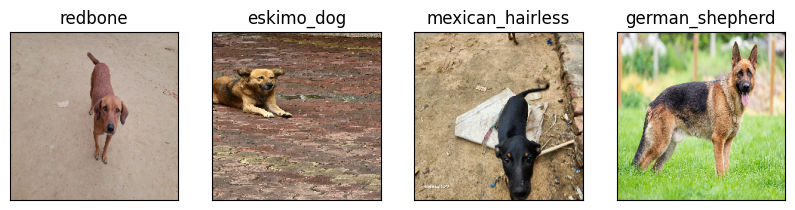

In [109]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 4, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)